# HOMEWORK 9

In this homework, you are going to use the dlib face detector and apply it to an image of your liking. You can follow the procedure shown in lesson 9. Please always comment your code so I can see what you're doing :-)

For this homework we are not going to provide you with any code, you'll have to build the face detector on your own.

### Step 0

Run the necessary imports.


In [17]:
import dlib
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

### Step 1

Load an image (any image that contains faces).

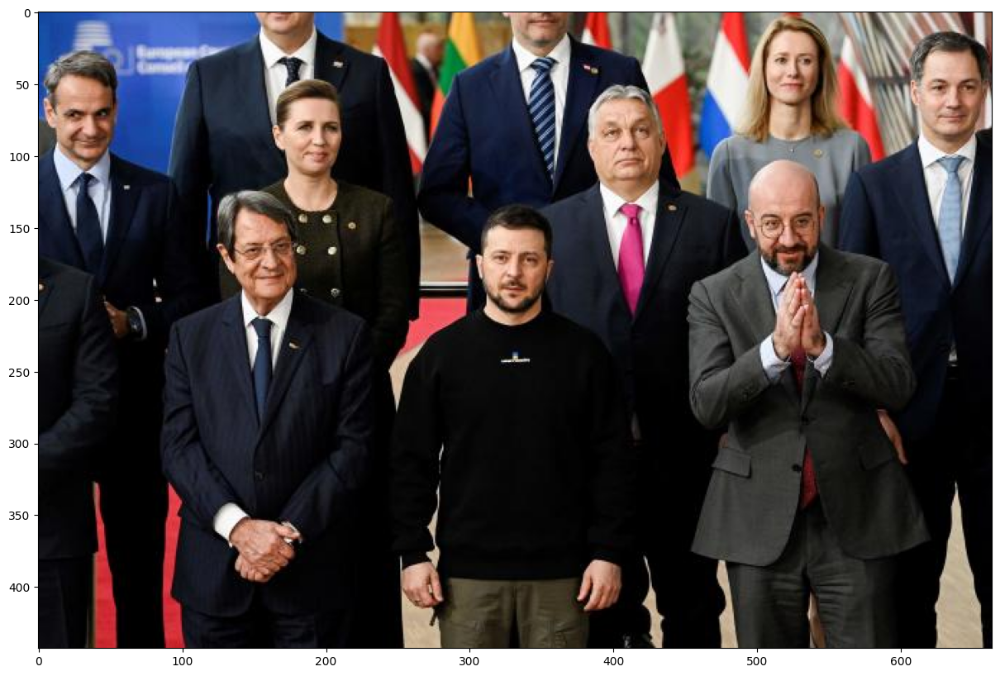

In [18]:
image_loaded = cv2.imread('../data/eu_summit.jpg')
plt.imshow(cv2.cvtColor(image_loaded, cv2.COLOR_BGR2RGB))

### Step 2

Load the dlib face predictor.

In [19]:
detector = dlib.get_frontal_face_detector()

### Step 3

Run the predictor on your image.

In [20]:
detected_faces = detector(image_loaded, 1)

### Step 4

Draw bounding boxes around the detected faces and plot the image. Use different colour for each face.

In [21]:
image_with_detections = image_loaded.copy()
for i, face in enumerate(detected_faces):
    # забирание координат лица
    left, top, right, bottom = face.left(), face.top(), face.right(), face.bottom()
    
    # выбор случайного цвета для рамки
    color = [int(x) for x in np.random.uniform(0, 255, 3)]
    
    # рисование рамки
    cv2.rectangle(image_with_detections, (left, top), (right, bottom), color, 2)

# конвертация изображения из RGB в BGR так как с самого начала мы не конвертировали
image_with_detections_bgr = cv2.cvtColor(image_with_detections, cv2.COLOR_RGB2BGR)


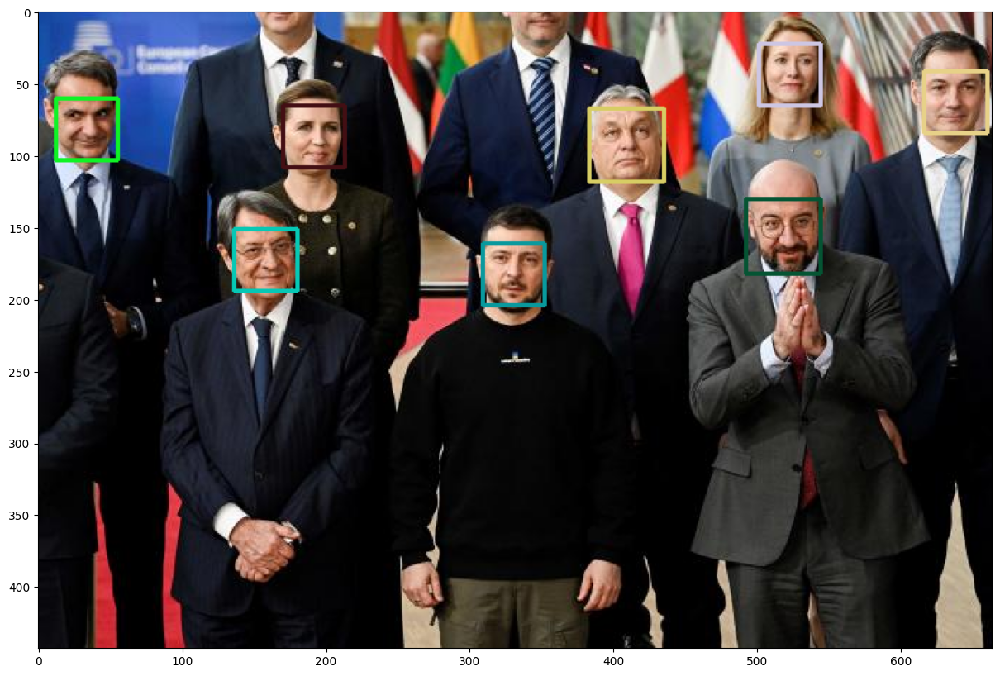

In [22]:
plt.imshow(image_with_detections_bgr)

### Step 5 (optional)

Repeat the process with a different and more challenging image (more faces, smaller faces, people with glasses, hats, helmets, etc.). How does the detector perform? Is it robust?

In [23]:
# обернем все в функцию чтобы дальше было удобно использовать
def detect_faces(image_path, upsample=1):
    image_loaded = cv2.imread(image_path)
    detector = dlib.get_frontal_face_detector()
    detected_faces = detector(image_loaded, upsample)
    image_with_detections = image_loaded.copy()
    print(len(detected_faces))
    for i, face in enumerate(detected_faces):
        # Extract the bounding box coordinates
        left, top, right, bottom = face.left(), face.top(), face.right(), face.bottom()
        
        # Choose a color for the bounding box. Let's use a different color for each face.
        color = [int(x) for x in np.random.uniform(0, 255, 3)]
        
        # Draw the bounding box
        cv2.rectangle(image_with_detections, (left, top), (right, bottom), color, 2)

    # Convert back to BGR for displaying with OpenCV
    image_with_detections_bgr = cv2.cvtColor(image_with_detections, cv2.COLOR_RGB2BGR)
    return image_with_detections_bgr




14


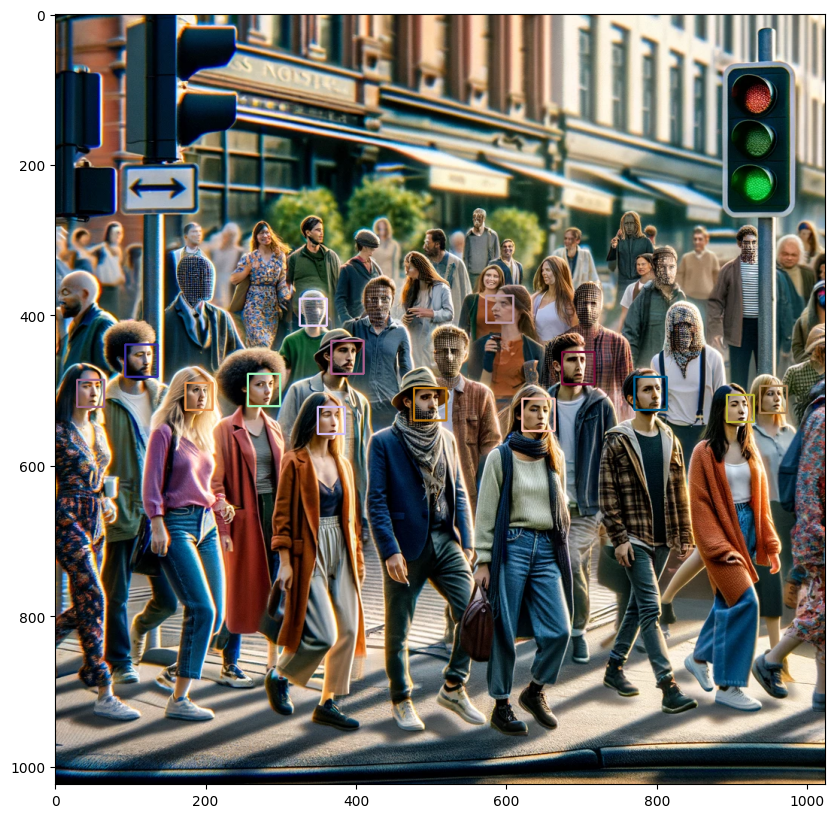

In [24]:
# сгенерил картинку с помощь dalee, чисто для теста :)
plt.imshow(detect_faces('../data/from_dalee.webp'))

22


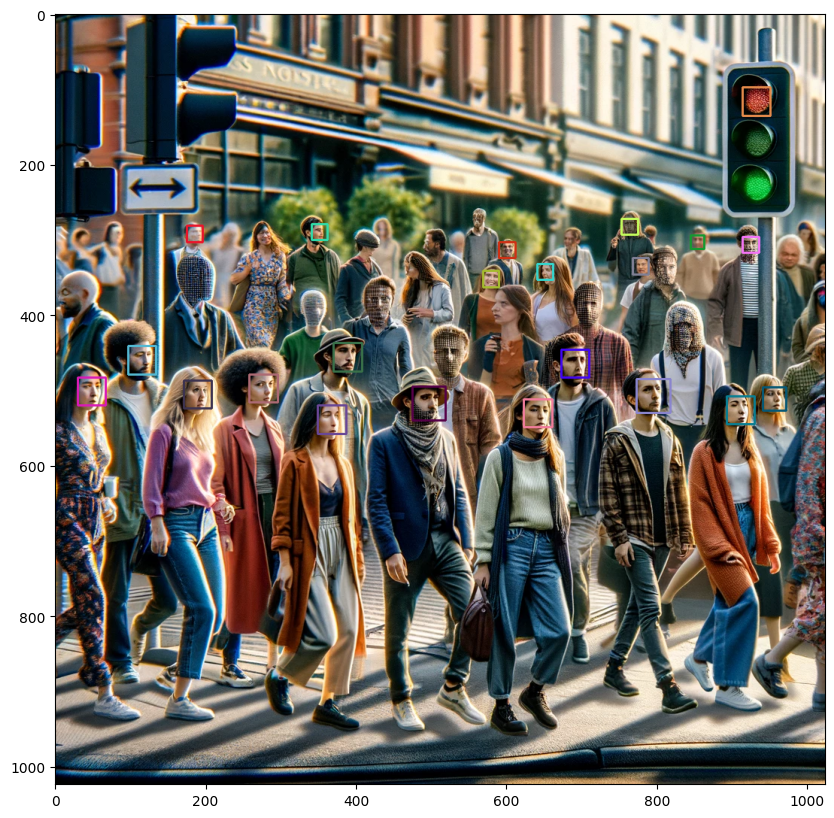

In [25]:
# увеличим upsample чтобы увеличить точность, видим что лиц нашлось больше
plt.imshow(detect_faces('../data/from_dalee.webp', 2))

17


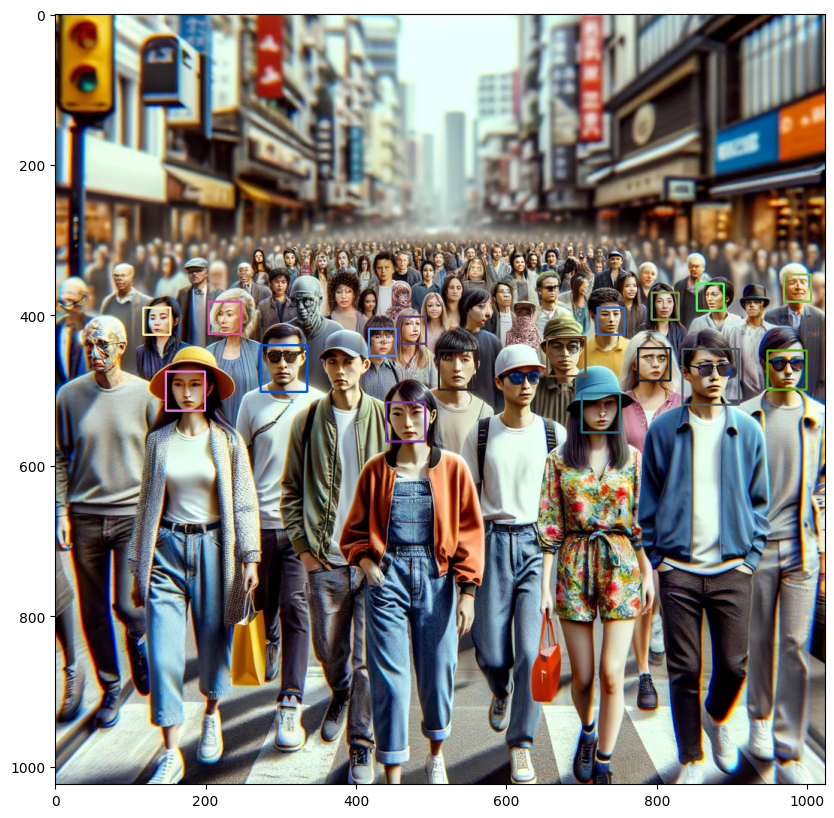

In [26]:
# сгенерил картинку с помощь dalee еще одну
plt.imshow(detect_faces('../data/from_dalee_2.webp'))

35


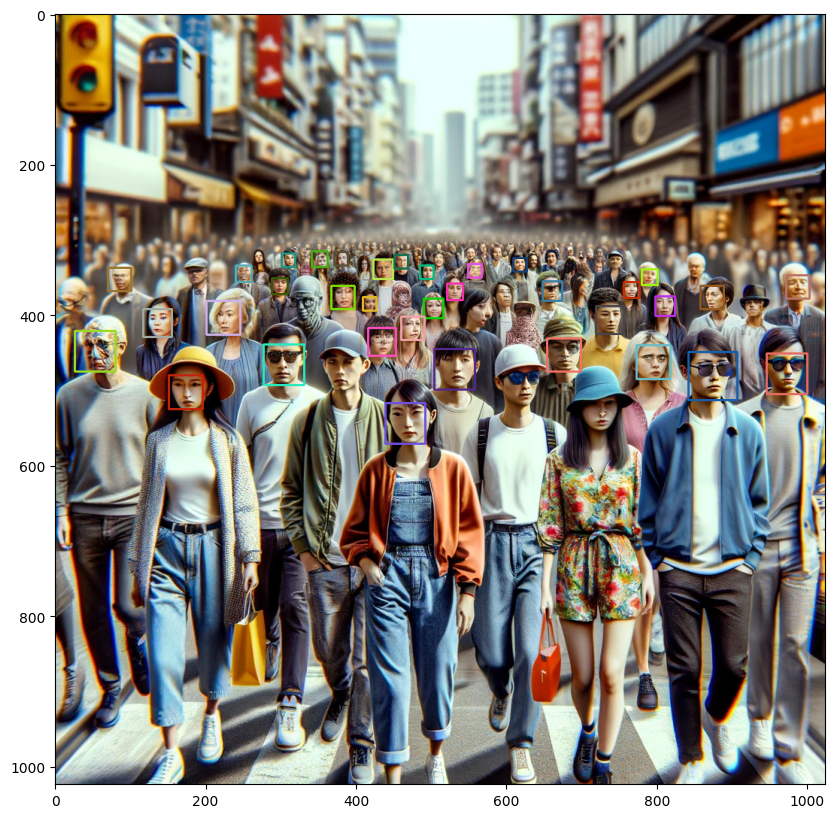

In [27]:
# увеличим upsample и видим на этом примере что нашли больше чем в два раза лиц
plt.imshow(detect_faces('../data/from_dalee_2.webp', 2))

2


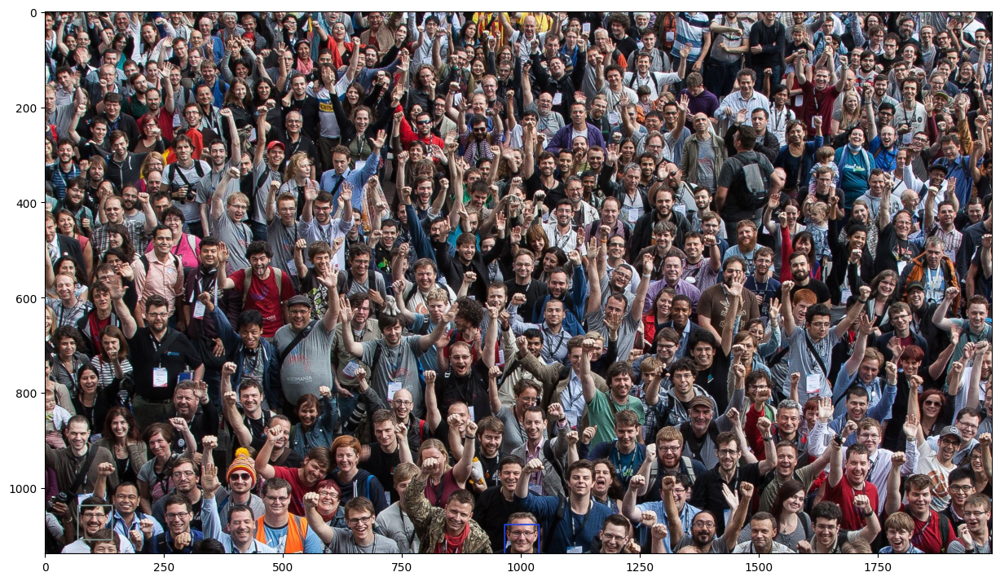

In [28]:
# нашел подхожящую картинку с множеством лиц в интете и запустил с upsample 0 (коффициент увеличения, как я понял из гугления этого метода) и видим что нашло 2 лица самых близких к камере (ближе к 0 координате)
plt.imshow(detect_faces('../data/many_people.jpg', 0))

174


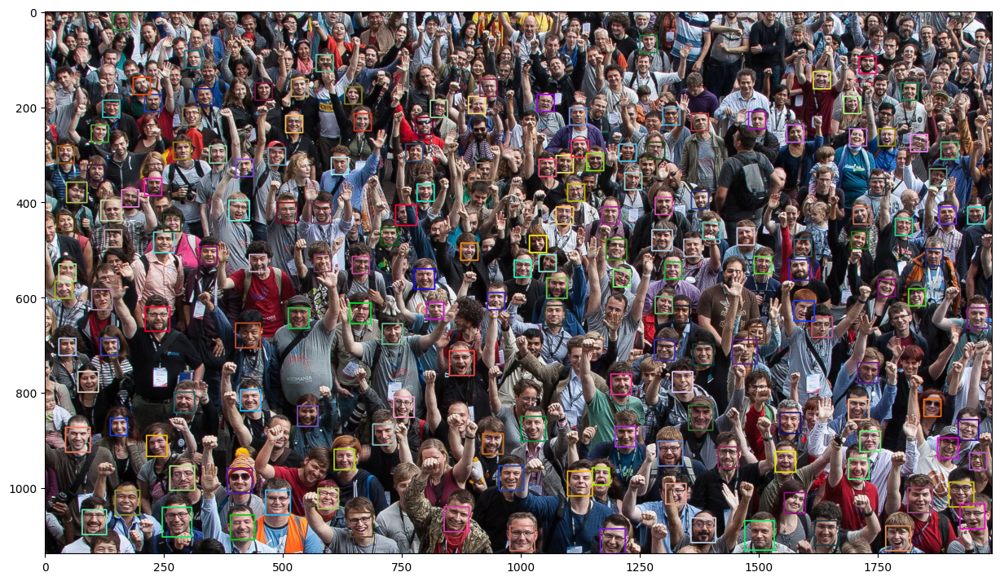

In [29]:
# устанавливаем коффициент увеличения в 1 и видим что нашло большую часть лиц
plt.imshow(detect_faces('../data/many_people.jpg', 1))

228


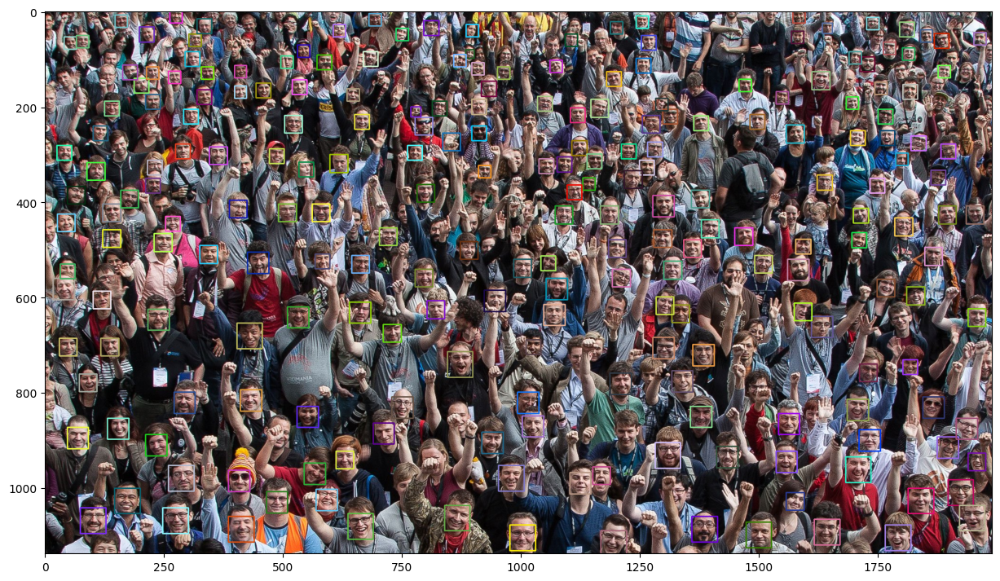

In [30]:
# делаем еще больше и видим что находим еще больше, но тратим на это времени почти в два раза больше
plt.imshow(detect_faces('../data/many_people.jpg', 2))

пробовал запустить с upsample = 4, но у меня не хватало оперативы чтобы ноут смог вытянуть это фото :) но я предпологаю что результат был бы +- таким же, нашел бы новые лица, но возможн какие-то потерял, которые находяться на переднем плане и/или которые повернуты. считаю что upsample 2 уже более чем хорошо подходит для детекции

еще в live_face.py сделал чтобы он брал каждый 10 кадр (для моего елеза оптимально каждый 5, успевает обрабатывать, но решил с запасом взять каждый 10) и искал лицо в отдельном потоке, чтобы само видео из вебки не тормозило. да, сам "квадрат" лица двигается с задержкой, но так определения лица трекается более эффектно :) думаю что это можно будет попробовать повторить и для 10 лекции, повторить если несколько лиц попадают в кадр чтобы он фиксировал цвет квадрата за каждым найденым лицом и дальше только им отрисовывал, но это если будет время :))

еще заметил что в FaceRecognition.ipynb при использовании face_recognition_sface_2021dec.onnx необхоимо вычислять не np.argmin, а np.argmax так как он теперь наоборот говорит что чем больше число, тем выше совпадение